# Chief Complaint Disease Predictor
This project uses MedCAT for medical concept annotation, fine-tuning, and mapping CUIs (Concept Unique Identifiers) to various medical coding systems (e.g., ICD-10, SNOMED CT, etc.).

---

## **1. Data Loading and Preprocessing**
This section loads the data, handles preprocessing, and prepares it for the annotation model.


In [55]:
import pandas as pd
import numpy as np
import seaborn as sns
import json

from matplotlib import pyplot as plt
from medcat.cat import CAT
from medcat.cdb import CDB
from medcat.config import Config
from medcat.vocab import Vocab
from medcat.meta_cat import MetaCAT
from medcat.config_meta_cat import ConfigMetaCAT
from medcat.preprocessing.tokenizers import TokenizerWrapperBPE
from medcat.tokenizers.meta_cat_tokenizers import TokenizerWrapperBERT
from tokenizers import ByteLevelBPETokenizer

In [3]:
DATA_DIR = "./annotation/"
! DATA_DIR="./annotation/"

In [11]:
# Load the data
data = pd.read_csv(DATA_DIR + "pt_notes.csv")
data.head()

,Unnamed: 0_x,subject_id,chartdate,category,text,create_year,Unnamed: 0_y,gender,dob,dob_year,age_year
0,6,1,2079-01-01,General Medicine,"HISTORY OF PRESENT ILLNESS:, The patient is a ...",2079,1,F,2018-01-01,2018,61
1,7,1,2079-01-01,Rheumatology,"HISTORY OF PRESENT ILLNESS: , A 71-year-old fe...",2079,1,F,2018-01-01,2018,61
2,8,1,2079-01-01,Consult - History and Phy.,"HISTORY OF PRESENT ILLNESS:, The patient is a ...",2079,1,F,2018-01-01,2018,61
3,9,2,2037-01-01,Consult - History and Phy.,"CHIEF COMPLAINT:,1. Infection.,2. Pelvic pai...",2037,2,F,2018-01-01,2018,19
4,10,2,2037-01-01,Dermatology,"SUBJECTIVE:, This is a 29-year-old Vietnamese...",2037,2,F,2018-01-01,2018,19


In [12]:
data.shape

(1088, 11)

In [4]:
# Download the models and required data
!wget -N https://raw.githubusercontent.com/CogStack/MedCATtutorials/main/notebooks/introductory/data/pt_notes.csv -P $DATA_DIR
!wget -N https://raw.githubusercontent.com/CogStack/MedCATtutorials/main/notebooks/introductory/data/MedCAT_Export.json -P $DATA_DIR

--2024-11-26 19:44:59--  https://raw.githubusercontent.com/CogStack/MedCATtutorials/main/notebooks/introductory/data/pt_notes.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3644222 (3.5M) [text/plain]
Saving to: ‘./data_p4.3/pt_notes.csv’

pt_notes.csv        100%[===================>]   3.47M  15.9MB/s    in 0.2s    

Last-modified header missing -- time-stamps turned off.
2024-11-26 19:45:02 (15.9 MB/s) - ‘./data_p4.3/pt_notes.csv’ saved [3644222/3644222]

--2024-11-26 19:45:02--  https://raw.githubusercontent.com/CogStack/MedCATtutorials/main/notebooks/introductory/data/MedCAT_Export.json
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (r

## **2. Model Loading and Filtering**
This section loads the MedCAT pre-trained model, applies filters to focus on diseases (T047) and mental health disorders (T048), and sets up annotation processing.


In [ ]:
MODEL_DIR = "./models/"
! MODEL_DIR="./models/"
model_pack_path = MODEL_DIR + "medmen_wstatus_2021_oct.zip"

In [ ]:
# Download the medcat modelpack
!wget -N https://cogstack-medcat-example-models.s3.eu-west-2.amazonaws.com/medcat-example-models/medmen_wstatus_2021_oct.zip -P $MODEL_DIR

In [5]:
cat = CAT.load_model_pack(model_pack_path)

/home/fast/miniconda3/envs/myenv/lib/python3.11/site-packages/medcat/meta_cat.py:430: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  meta_cat.model.load_state_dict(torch.load

In [6]:
# Detect only Disease and Mental Disorders
# |T047|Disease or Syndrome
# |T048|Mental or Behavioral Dysfunction
type_ids_filter = ['T047', 'T048']
cui_filters = set()
for type_ids in type_ids_filter:
    cui_filters.update(cat.cdb.addl_info['type_id2cuis'][type_ids])
cat.cdb.config.linking['filters']['cuis'] = cui_filters

## **3. Annotation and Results Generation**
We use MedCAT to annotate patient notes and save the results in `results.json`.

In [13]:
# format the df to match: required input data for multiprocessing = [(doc_id, doc_text), (doc_id, doc_text), ...]
def data_iterator(data):
    for id, row in data[['text']].iterrows():
        yield (id, str(row['text']))

In [14]:
# Set a batch size to control for the variablity between document sizes
batch_size_chars = 500000 # Batch size (BS) in number of characters

# Run model
# NOTE: The method below has changed. The `multiprocessing` method has been
#       deprecated and the following should be used instead. This is because
#       there were multiple multiprocessing methods and there was no clear
#       distinction between them.
results = cat.multiprocessing_batch_char_size(data_iterator(data),  # Formatted data
                                              batch_size_chars = batch_size_chars,
                                              nproc=8) # Number of processors

Processing: 0batch [00:00, ?batch/s]

In [15]:
json.dump(results, open("./results.json", 'w'))

In [16]:
import pandas as pd
import json
from datetime import datetime

# Load the pt_notes.csv
pt_notes = pd.read_csv('./data_p4.3/pt_notes.csv')  # Update path accordingly

# Load results.json
with open('./results.json', 'r') as file:
    results = json.load(file)

# Adjust Unnamed: 0_x to integer for consistent key types
pt_notes['Unnamed: 0_x'] = pt_notes['Unnamed: 0_x'].astype(int)

# Create a mapping directly from `doc_id` to text based on index position
doc_text_mapping = dict(zip(pt_notes.index, pt_notes['text']))

# Debug: Check mapping keys
print(f"Keys in doc_text_mapping: {list(doc_text_mapping.keys())[:5]}")

# Initialize MedCAT Export structure
medcat_export = {
    "projects": [{
        "name": "Fine-tuning Project",
        "id": 1,
        "cuis": "",
        "tuis": "T047,T048",  # Example TUIs, adjust as needed
        "documents": []
    }]
}

# Process each document in results.json
for idx, (doc_id, doc_content) in enumerate(sorted(results.items(), key=lambda x: int(x[0]))):
    document_text = doc_text_mapping.get(idx, None)  # Match text by index

    if not document_text:
        print(f"Warning: No text found for index: {idx}")

    # Create the document structure
    document = {
        "id": int(doc_id),
        "name": f"Document_{doc_id}",
        "text": document_text or "",  # Default to empty string if text is missing
        "last_modified": datetime.utcnow().isoformat(),
        "annotations": []
    }

    # Convert entities into annotations
    entities = doc_content.get("entities", {})
    for entity_id, entity in entities.items():
        annotation = {
            "id": int(entity_id),
            "user": "automated",
            "cui": entity.get("cui"),
            "value": entity.get("pretty_name"),
            "start": entity.get("start"),
            "end": entity.get("end"),
            "validated": True,
            "correct": True,
            "deleted": False,
            "alternative": False,
            "killed": False,
            "last_modified": datetime.utcnow().isoformat(),
            "manually_created": False,
            "acc": entity.get("acc", 1.0),
            "meta_anns": [{"name": k, "value": v["value"], "acc": v["confidence"]}
                          for k, v in entity.get("meta_anns", {}).items()]
        }
        document["annotations"].append(annotation)

    medcat_export["projects"][0]["documents"].append(document)

# Save the converted JSON for fine-tuning
output_path = './formatted.json'  # Define your desired output path
with open(output_path, 'w') as outfile:
    json.dump(medcat_export, outfile, indent=4)

print(f"Converted file saved at {output_path}")


Keys in doc_text_mapping: [0, 1, 2, 3, 4]
Converted file saved at ./formatted.json


## **4. Fine-tuning MedCAT**
We fine-tune the MedCAT model using the annotated `results.json` and save the formatted dataset in `formatted.json`.


In [17]:
DATA_DIR = "./finetuning/"
! DATA_DIR="./finetuning/"
vocab_path = DATA_DIR + "vocab.dat"
cdb_path = DATA_DIR + "cdb-medmen-v1.dat"

In [18]:
!wget -N https://cogstack-medcat-example-models.s3.eu-west-2.amazonaws.com/medcat-example-models/vocab.dat -P $DATA_DIR
!wget -N https://cogstack-medcat-example-models.s3.eu-west-2.amazonaws.com/medcat-example-models/cdb-medmen-v1.dat -P $DATA_DIR

--2024-11-26 19:53:35--  https://cogstack-medcat-example-models.s3.eu-west-2.amazonaws.com/medcat-example-models/vocab.dat
Resolving cogstack-medcat-example-models.s3.eu-west-2.amazonaws.com (cogstack-medcat-example-models.s3.eu-west-2.amazonaws.com)... 52.95.144.42, 3.5.244.46, 52.95.148.86, ...
Connecting to cogstack-medcat-example-models.s3.eu-west-2.amazonaws.com (cogstack-medcat-example-models.s3.eu-west-2.amazonaws.com)|52.95.144.42|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 274445907 (262M) [binary/octet-stream]
Saving to: ‘./data_p4.2/vocab.dat’

vocab.dat           100%[===================>] 261.73M  4.68MB/s    in 2m 14s  

2024-11-26 19:55:50 (1.95 MB/s) - ‘./data_p4.2/vocab.dat’ saved [274445907/274445907]

--2024-11-26 19:55:51--  https://cogstack-medcat-example-models.s3.eu-west-2.amazonaws.com/medcat-example-models/cdb-medmen-v1.dat
Resolving cogstack-medcat-example-models.s3.eu-west-2.amazonaws.com (cogstack-medcat-example-models.s3.eu-wes

In [19]:
data = json.load(open("./formatted.json"))

In [20]:
print(data.keys())

dict_keys(['projects'])


In [21]:
data['projects'][0].keys()

dict_keys(['name', 'id', 'cuis', 'tuis', 'documents'])

In [22]:
#@title
data['projects'][0]['documents'][0].keys()

dict_keys(['id', 'name', 'text', 'last_modified', 'annotations'])

In [23]:
#@title
data['projects'][0]['documents'][0]['annotations'][0].keys()

dict_keys(['id', 'user', 'cui', 'value', 'start', 'end', 'validated', 'correct', 'deleted', 'alternative', 'killed', 'last_modified', 'manually_created', 'acc', 'meta_anns'])

In [24]:
#@title
data['projects'][0]['documents'][0]['annotations'][0]['meta_anns'][0].keys()

dict_keys(['name', 'value', 'acc'])

In [26]:
from medcat.cdb import CDB
# Create and load the CDB (Concept Database)
cdb = CDB.load(cdb_path)
# NOTE: CDBs saved prior to medcat 1.10 will also load a config
#       as part of the CDB, but below we'll be changing that anyway

# Create and load the Vocabulary
vocab = Vocab.load(vocab_path)

# Setup config
config = Config()
config.general['spacy_model'] = 'en_core_web_md'

# Create CAT - the main class from medcat used for concept annotation
cat = CAT(cdb=cdb, config=config, vocab=vocab)

In [27]:
cat.train_supervised_from_json(data_path="./formatted.json",
                               nepochs=10,
                               reset_cui_count=False,
                               print_stats=True,
                               use_filters=True)

Stats document: 100%|███████████████████████| 1088/1088 [02:10<00:00,  9.72it/s]
                                                                                

Epoch: 0, Prec: 0.9887595742564409, Rec: 0.9215649916558502, F1: 0.9539805172992947

Docs with false positives: Document_448; Document_367; Document_778; Document_366; Document_480; Document_776; Document_0; Document_799; Document_365; Document_584

Docs with false negatives: Document_262; Document_274; Document_448; Document_480; Document_373; Document_361; Document_1086; Document_832; Document_835; Document_979



False Positives

Dermatologic disorders                                                 - C0037274             -         22
Diabetes Mellitus                                                      - C0011849             -         20
Dental caries                                                          - C0011334             -         17
Alzheimer's Disease                                                    - C0002395             -         14
Respiratory Failure                                                    - C1145670             -         13
Kidney Diseases             

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Project:   0%|          | 0/1 [00:00<?, ?it/s]

Document:   0%|          | 0/1088 [00:00<?, ?it/s]


Stats project:   0%|                                      | 0/1 [00:00<?, ?it/s]

Stats document:   0%|                                  | 0/1088 [00:00<?, ?it/s]

Stats document:   0%|                          | 1/1088 [00:00<02:42,  6.68it/s]

Stats document:   0%|                          | 3/1088 [00:00<02:16,  7.95it/s]

Stats document:   0%|                          | 5/1088 [00:00<01:41, 10.67it/s]

Stats document:   1%|▏                         | 7/1088 [00:00<01:32, 11.66it/s]

Stats document:   1%|▏                         | 9/1088 [00:00<01:26, 12.45it/s]

Stats document:   1%|▎                        | 11/1088 [00:01<01:39, 10.80it/s]

Stats document:   1%|▎                        | 13/1088 [00:01<01:48,  9.95it/s]

Stats document:   1%|▎                        | 15/1088 [00:01<01:53,  9.45it/s]

Stats document:   2%|▍                        | 17/1088 [00:01<01:44, 10.22it/s]

Stats document:   2%|▍                        | 19/1088 [00:01<01:41, 10.54it/s]

Stats document:

Epoch: 1, Prec: 0.653657323969921, Rec: 0.9751529760801039, F1: 0.7826766380176359

Docs with false positives: Document_262; Document_451; Document_448; Document_35; Document_552; Document_650; Document_939; Document_351; Document_630; Document_640

Docs with false negatives: Document_17; Document_151; Document_367; Document_147; Document_65; Document_123; Document_130; Document_16; Document_366; Document_562



False Positives

Mental disorders                                                       - C0004936             -        882
Anxiety state                                                          - C0700613             -        525
Drug usage                                                             - C0242510             -        400
Hypertensive disease                                                   - C0020538             -        343
Disease                                                                - C0012634             -        281
Myocardial Diseases, Secondary  

Project:   0%|          | 0/1 [00:00<?, ?it/s]

Document:   0%|          | 0/1088 [00:00<?, ?it/s]


Stats project:   0%|                                      | 0/1 [00:00<?, ?it/s]

Stats document:   0%|                                  | 0/1088 [00:00<?, ?it/s]

Stats document:   0%|                          | 1/1088 [00:00<02:42,  6.68it/s]

Stats document:   0%|                          | 3/1088 [00:00<02:14,  8.06it/s]

Stats document:   0%|                          | 5/1088 [00:00<01:40, 10.74it/s]

Stats document:   1%|▏                         | 7/1088 [00:00<01:32, 11.68it/s]

Stats document:   1%|▏                         | 9/1088 [00:00<01:26, 12.43it/s]

Stats document:   1%|▎                        | 11/1088 [00:01<01:40, 10.77it/s]

Stats document:   1%|▎                        | 13/1088 [00:01<01:48,  9.94it/s]

Stats document:   1%|▎                        | 15/1088 [00:01<01:53,  9.45it/s]

Stats document:   2%|▍                        | 17/1088 [00:01<01:44, 10.21it/s]

Stats document:   2%|▍                        | 19/1088 [00:01<01:41, 10.52it/s]

Stats document:

Epoch: 2, Prec: 0.6130290504744716, Rec: 0.9762655293899499, F1: 0.7531380753138075

Docs with false positives: Document_262; Document_451; Document_448; Document_35; Document_552; Document_650; Document_939; Document_351; Document_630; Document_640

Docs with false negatives: Document_17; Document_151; Document_147; Document_65; Document_123; Document_130; Document_16; Document_562; Document_287; Document_1086



False Positives

Mental disorders                                                       - C0004936             -        900
Anxiety state                                                          - C0700613             -        556
Hypertensive disease                                                   - C0020538             -        421
Drug usage                                                             - C0242510             -        400
Disease                                                                - C0012634             -        391
Obesity                       

Project:   0%|          | 0/1 [00:00<?, ?it/s]

Document:   0%|          | 0/1088 [00:00<?, ?it/s]


Stats project:   0%|                                      | 0/1 [00:00<?, ?it/s]

Stats document:   0%|                                  | 0/1088 [00:00<?, ?it/s]

Stats document:   0%|                          | 1/1088 [00:00<02:39,  6.81it/s]

Stats document:   0%|                          | 3/1088 [00:00<02:11,  8.24it/s]

Stats document:   0%|                          | 5/1088 [00:00<01:38, 10.96it/s]

Stats document:   1%|▏                         | 7/1088 [00:00<01:31, 11.86it/s]

Stats document:   1%|▏                         | 9/1088 [00:00<01:25, 12.62it/s]

Stats document:   1%|▎                        | 11/1088 [00:01<01:39, 10.83it/s]

Stats document:   1%|▎                        | 13/1088 [00:01<01:47, 10.01it/s]

Stats document:   1%|▎                        | 15/1088 [00:01<01:52,  9.50it/s]

Stats document:   2%|▍                        | 17/1088 [00:01<01:44, 10.28it/s]

Stats document:   2%|▍                        | 19/1088 [00:01<01:40, 10.63it/s]

Stats document:

Epoch: 3, Prec: 0.5979118197809681, Rec: 0.9769145188206935, F1: 0.7418071737829561

Docs with false positives: Document_262; Document_451; Document_448; Document_35; Document_552; Document_650; Document_939; Document_351; Document_630; Document_640

Docs with false negatives: Document_17; Document_151; Document_147; Document_65; Document_123; Document_130; Document_16; Document_562; Document_287; Document_1086



False Positives

Mental disorders                                                       - C0004936             -        896
Anxiety state                                                          - C0700613             -        570
Disease                                                                - C0012634             -        517
Hypertensive disease                                                   - C0020538             -        453
Drug usage                                                             - C0242510             -        400
Obesity                       

Project:   0%|          | 0/1 [00:00<?, ?it/s]

Document:   0%|          | 0/1088 [00:00<?, ?it/s]


Stats project:   0%|                                      | 0/1 [00:00<?, ?it/s]

Stats document:   0%|                                  | 0/1088 [00:00<?, ?it/s]

Stats document:   0%|                          | 1/1088 [00:00<02:41,  6.72it/s]

Stats document:   0%|                          | 3/1088 [00:00<02:13,  8.11it/s]

Stats document:   0%|                          | 5/1088 [00:00<01:40, 10.78it/s]

Stats document:   1%|▏                         | 7/1088 [00:00<01:32, 11.72it/s]

Stats document:   1%|▏                         | 9/1088 [00:00<01:26, 12.45it/s]

Stats document:   1%|▎                        | 11/1088 [00:01<01:40, 10.76it/s]

Stats document:   1%|▎                        | 13/1088 [00:01<01:48,  9.89it/s]

Stats document:   1%|▎                        | 15/1088 [00:01<01:54,  9.35it/s]

Stats document:   2%|▍                        | 17/1088 [00:01<01:45, 10.13it/s]

Stats document:   2%|▍                        | 19/1088 [00:01<01:42, 10.44it/s]

Stats document:

Epoch: 4, Prec: 0.5883534136546185, Rec: 0.9779343593547191, F1: 0.7346938775510204

Docs with false positives: Document_262; Document_451; Document_448; Document_35; Document_552; Document_650; Document_939; Document_351; Document_630; Document_640

Docs with false negatives: Document_17; Document_151; Document_147; Document_123; Document_130; Document_16; Document_562; Document_287; Document_1086; Document_706



False Positives

Mental disorders                                                       - C0004936             -        896
Anxiety state                                                          - C0700613             -        585
Disease                                                                - C0012634             -        572
Hypertensive disease                                                   - C0020538             -        457
Obesity                                                                - C0028754             -        412
Drug usage                   

Project:   0%|          | 0/1 [00:00<?, ?it/s]

Document:   0%|          | 0/1088 [00:00<?, ?it/s]


Stats project:   0%|                                      | 0/1 [00:00<?, ?it/s]

Stats document:   0%|                                  | 0/1088 [00:00<?, ?it/s]

Stats document:   0%|                          | 1/1088 [00:00<02:43,  6.67it/s]

Stats document:   0%|                          | 3/1088 [00:00<02:17,  7.89it/s]

Stats document:   0%|                          | 5/1088 [00:00<01:43, 10.49it/s]

Stats document:   1%|▏                         | 7/1088 [00:00<01:33, 11.51it/s]

Stats document:   1%|▏                         | 9/1088 [00:00<01:27, 12.27it/s]

Stats document:   1%|▎                        | 11/1088 [00:01<01:40, 10.71it/s]

Stats document:   1%|▎                        | 13/1088 [00:01<01:48,  9.91it/s]

Stats document:   1%|▎                        | 15/1088 [00:01<01:54,  9.39it/s]

Stats document:   2%|▍                        | 17/1088 [00:01<01:45, 10.18it/s]

Stats document:   2%|▍                        | 19/1088 [00:01<01:42, 10.47it/s]

Stats document:

Epoch: 5, Prec: 0.5818944116511281, Rec: 0.9779343593547191, F1: 0.7296371874243419

Docs with false positives: Document_262; Document_451; Document_448; Document_35; Document_552; Document_650; Document_939; Document_351; Document_630; Document_640

Docs with false negatives: Document_17; Document_151; Document_147; Document_123; Document_130; Document_16; Document_562; Document_287; Document_1086; Document_706



False Positives

Mental disorders                                                       - C0004936             -        896
Disease                                                                - C0012634             -        608
Anxiety state                                                          - C0700613             -        587
Hypertensive disease                                                   - C0020538             -        480
Obesity                                                                - C0028754             -        412
Drug usage                   

Project:   0%|          | 0/1 [00:00<?, ?it/s]

Document:   0%|          | 0/1088 [00:00<?, ?it/s]


Stats project:   0%|                                      | 0/1 [00:00<?, ?it/s]

Stats document:   0%|                                  | 0/1088 [00:00<?, ?it/s]

Stats document:   0%|                          | 1/1088 [00:00<02:42,  6.69it/s]

Stats document:   0%|                          | 3/1088 [00:00<02:14,  8.04it/s]

Stats document:   0%|                          | 5/1088 [00:00<01:41, 10.71it/s]

Stats document:   1%|▏                         | 7/1088 [00:00<01:32, 11.69it/s]

Stats document:   1%|▏                         | 9/1088 [00:00<01:27, 12.35it/s]

Stats document:   1%|▎                        | 11/1088 [00:01<01:40, 10.68it/s]

Stats document:   1%|▎                        | 13/1088 [00:01<01:49,  9.85it/s]

Stats document:   1%|▎                        | 15/1088 [00:01<01:54,  9.36it/s]

Stats document:   2%|▍                        | 17/1088 [00:01<01:45, 10.15it/s]

Stats document:   2%|▍                        | 19/1088 [00:01<01:42, 10.46it/s]

Stats document:

Epoch: 6, Prec: 0.5768347369572351, Rec: 0.9779343593547191, F1: 0.7256466703357183

Docs with false positives: Document_262; Document_451; Document_448; Document_35; Document_552; Document_650; Document_939; Document_351; Document_630; Document_640

Docs with false negatives: Document_17; Document_151; Document_147; Document_123; Document_130; Document_16; Document_562; Document_287; Document_1086; Document_706



False Positives

Mental disorders                                                       - C0004936             -        890
Disease                                                                - C0012634             -        647
Anxiety state                                                          - C0700613             -        596
Hypertensive disease                                                   - C0020538             -        482
Obesity                                                                - C0028754             -        412
Drug usage                   

Project:   0%|          | 0/1 [00:00<?, ?it/s]

Document:   0%|          | 0/1088 [00:00<?, ?it/s]


Stats project:   0%|                                      | 0/1 [00:00<?, ?it/s]

Stats document:   0%|                                  | 0/1088 [00:00<?, ?it/s]

Stats document:   0%|                          | 1/1088 [00:00<02:41,  6.72it/s]

Stats document:   0%|                          | 3/1088 [00:00<02:12,  8.18it/s]

Stats document:   0%|                          | 5/1088 [00:00<01:39, 10.87it/s]

Stats document:   1%|▏                         | 7/1088 [00:00<01:31, 11.76it/s]

Stats document:   1%|▏                         | 9/1088 [00:00<01:26, 12.46it/s]

Stats document:   1%|▎                        | 11/1088 [00:01<01:40, 10.74it/s]

Stats document:   1%|▎                        | 13/1088 [00:01<01:48,  9.89it/s]

Stats document:   1%|▎                        | 15/1088 [00:01<01:54,  9.36it/s]

Stats document:   2%|▍                        | 17/1088 [00:01<01:45, 10.14it/s]

Stats document:   2%|▍                        | 19/1088 [00:01<01:42, 10.42it/s]

Stats document:

Epoch: 7, Prec: 0.5740720583433112, Rec: 0.9779343593547191, F1: 0.7234567901234568

Docs with false positives: Document_262; Document_451; Document_448; Document_35; Document_552; Document_650; Document_939; Document_351; Document_630; Document_640

Docs with false negatives: Document_17; Document_151; Document_147; Document_123; Document_130; Document_16; Document_562; Document_287; Document_1086; Document_706



False Positives

Mental disorders                                                       - C0004936             -        890
Disease                                                                - C0012634             -        669
Anxiety state                                                          - C0700613             -        596
Hypertensive disease                                                   - C0020538             -        485
Obesity                                                                - C0028754             -        419
Drug usage                   

Project:   0%|          | 0/1 [00:00<?, ?it/s]

Document:   0%|          | 0/1088 [00:00<?, ?it/s]


Stats project:   0%|                                      | 0/1 [00:00<?, ?it/s]

Stats document:   0%|                                  | 0/1088 [00:00<?, ?it/s]

Stats document:   0%|                          | 1/1088 [00:00<02:40,  6.77it/s]

Stats document:   0%|                          | 3/1088 [00:00<02:13,  8.14it/s]

Stats document:   0%|                          | 5/1088 [00:00<01:40, 10.82it/s]

Stats document:   1%|▏                         | 7/1088 [00:00<01:32, 11.73it/s]

Stats document:   1%|▏                         | 9/1088 [00:00<01:26, 12.48it/s]

Stats document:   1%|▎                        | 11/1088 [00:01<01:39, 10.81it/s]

Stats document:   1%|▎                        | 13/1088 [00:01<01:47,  9.98it/s]

Stats document:   1%|▎                        | 15/1088 [00:01<01:53,  9.44it/s]

Stats document:   2%|▍                        | 17/1088 [00:01<01:44, 10.20it/s]

Stats document:   2%|▍                        | 19/1088 [00:01<01:41, 10.51it/s]

Stats document:

Epoch: 8, Prec: 0.5688984881209503, Rec: 0.976821806044873, F1: 0.7190336449873745

Docs with false positives: Document_262; Document_451; Document_448; Document_35; Document_552; Document_650; Document_939; Document_351; Document_630; Document_640

Docs with false negatives: Document_17; Document_151; Document_147; Document_123; Document_130; Document_16; Document_562; Document_287; Document_1086; Document_706



False Positives

Mental disorders                                                       - C0004936             -        890
Disease                                                                - C0012634             -        691
Anxiety state                                                          - C0700613             -        599
Hypertensive disease                                                   - C0020538             -        485
Obesity                                                                - C0028754             -        419
Drug usage                    

Project:   0%|          | 0/1 [00:00<?, ?it/s]

Document:   0%|          | 0/1088 [00:00<?, ?it/s]


Stats project:   0%|                                      | 0/1 [00:00<?, ?it/s]

Stats document:   0%|                                  | 0/1088 [00:00<?, ?it/s]

Stats document:   0%|                          | 1/1088 [00:00<02:40,  6.77it/s]

Stats document:   0%|                          | 3/1088 [00:00<02:12,  8.16it/s]

Stats document:   0%|                          | 5/1088 [00:00<01:39, 10.84it/s]

Stats document:   1%|▏                         | 7/1088 [00:00<01:31, 11.78it/s]

Stats document:   1%|▏                         | 9/1088 [00:00<01:26, 12.44it/s]

Stats document:   1%|▎                        | 11/1088 [00:01<01:39, 10.81it/s]

Stats document:   1%|▎                        | 13/1088 [00:01<01:47,  9.99it/s]

Stats document:   1%|▎                        | 15/1088 [00:01<01:53,  9.47it/s]

Stats document:   2%|▍                        | 17/1088 [00:01<01:44, 10.25it/s]

Stats document:   2%|▍                        | 19/1088 [00:01<01:41, 10.56it/s]

Stats document:

Epoch: 9, Prec: 0.5662021843223759, Rec: 0.9757092527350268, F1: 0.7165764477581452

Docs with false positives: Document_262; Document_451; Document_448; Document_35; Document_552; Document_650; Document_939; Document_351; Document_630; Document_640

Docs with false negatives: Document_17; Document_151; Document_147; Document_123; Document_130; Document_16; Document_562; Document_287; Document_1086; Document_706



False Positives

Mental disorders                                                       - C0004936             -        890
Disease                                                                - C0012634             -        706
Anxiety state                                                          - C0700613             -        599
Hypertensive disease                                                   - C0020538             -        490
Obesity                                                                - C0028754             -        427
Drug usage                   

Project:   0%|          | 0/1 [00:00<?, ?it/s]

Document:   0%|          | 0/1088 [00:00<?, ?it/s]


Stats project:   0%|                                      | 0/1 [00:00<?, ?it/s]

Stats document:   0%|                                  | 0/1088 [00:00<?, ?it/s]

Stats document:   0%|                          | 1/1088 [00:00<02:41,  6.74it/s]

Stats document:   0%|                          | 3/1088 [00:00<02:13,  8.11it/s]

Stats document:   0%|                          | 5/1088 [00:00<01:40, 10.79it/s]

Stats document:   1%|▏                         | 7/1088 [00:00<01:32, 11.73it/s]

Stats document:   1%|▏                         | 9/1088 [00:00<01:26, 12.50it/s]

Stats document:   1%|▎                        | 11/1088 [00:01<01:40, 10.74it/s]

Stats document:   1%|▎                        | 13/1088 [00:01<01:48,  9.91it/s]

Stats document:   1%|▎                        | 15/1088 [00:01<01:54,  9.37it/s]

Stats document:   2%|▍                        | 17/1088 [00:01<01:45, 10.15it/s]

Stats document:   2%|▍                        | 19/1088 [00:01<01:42, 10.45it/s]

Stats document:

Epoch: 10, Prec: 0.5634534068404432, Rec: 0.9759873910624884, F1: 0.7144456886898096

Docs with false positives: Document_262; Document_451; Document_448; Document_35; Document_552; Document_650; Document_939; Document_351; Document_630; Document_640

Docs with false negatives: Document_17; Document_151; Document_147; Document_123; Document_130; Document_16; Document_562; Document_287; Document_1086; Document_706



False Positives

Mental disorders                                                       - C0004936             -        890
Disease                                                                - C0012634             -        711
Anxiety state                                                          - C0700613             -        606
Hypertensive disease                                                   - C0020538             -        494
Obesity                                                                - C0028754             -        430
Skin Diseases, Infectious   

({'C0004936': 890,
  'C0011849': 4,
  'C0700613': 606,
  'C0020538': 494,
  'C0041327': 50,
  'C0519066': 77,
  'C0014544': 70,
  'C0037278': 409,
  'C0085762': 331,
  'C0242510': 400,
  'C0497156': 66,
  'C0012634': 711,
  'C0027765': 175,
  'C0028754': 430,
  'C0001314': 47,
  'C1145670': 147,
  'C0008679': 342,
  'C0018799': 136,
  'C0018801': 168,
  'C1458140': 10,
  'C1704436': 13,
  'C1565489': 72,
  'C0151744': 20,
  'C0850624': 174,
  'C0010054': 21,
  'C1510475': 22,
  'C0036529': 265,
  'C0238792': 228,
  'C0022354': 18,
  'C0038443': 62,
  'C0009241': 89,
  'C0037284': 142,
  'C0003864': 25,
  'C0025517': 28,
  'C0152244': 50,
  'C3203533': 34,
  'C0022658': 51,
  'C0003469': 20,
  'C0338614': 109,
  'C0020550': 7,
  'C0023895': 61,
  'C0233794': 38,
  'C0013146': 81,
  'C0007222': 61,
  'C0031099': 24,
  'C0038454': 10,
  'C0683278': 15,
  'C0019247': 43,
  'C0525045': 104,
  'C4048329': 8,
  'C0018965': 8,
  'C0018889': 58,
  'C0018939': 44,
  'C0042345': 19,
  'C0037274':

## **5. Evaluation and Results**
After fine-tuning the MedCAT model, we evaluate its performance using accuracy, precision, recall, and F1-Score.


In [58]:
data = json.load(open("./formatted.json"))
fps, fns, tps, cui_prec, cui_rec, cui_f1, cui_counts, examples = cat._print_stats(data, extra_cui_filter=True)

Stats document: 100%|███████████████████████| 1088/1088 [02:11<00:00,  9.83it/s]
                                                                                

Epoch: 0, Prec: 0.0632210544775839, Rec: 0.9358427591322084, F1: 0.11844081479395477

Docs with false positives: Document_262; Document_274; Document_451; Document_205; Document_448; Document_35; Document_552; Document_650; Document_939; Document_351

Docs with false negatives: Document_552; Document_650; Document_907; Document_640; Document_480; Document_906; Document_361; Document_1086; Document_0; Document_649



False Positives

Patients                                                               - C0030705             -       7521
Normal                                                                 - C0205307             -       2292
Medical History                                                        - C0262926             -       2090
year                                                                   - C0439234             -       1335
Pain                                                                   - C0030193             -       1182
Time                        

In [59]:
from medcat.stats.kfold import get_k_fold_stats
fps, fns, tps, cui_prec, cui_rec, cui_f1, cui_counts, examples = get_k_fold_stats(cat, data)
cui = "C0020538" # Hypertension
print(cui_f1[cui], cui_prec[cui], cui_rec[cui])

Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Project:   0%|          | 0/1 [00:00<?, ?it/s]

Document:   0%|          | 0/377 [00:00<?, ?it/s]

Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Project:   0%|          | 0/1 [00:00<?, ?it/s]

Document:   0%|          | 0/355 [00:00<?, ?it/s]

Stats document: 100%|█████████████████████████| 356/356 [00:43<00:00, 11.38it/s]


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Project:   0%|          | 0/1 [00:00<?, ?it/s]

Document:   0%|          | 0/356 [00:00<?, ?it/s]

Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Project:   0%|          | 0/1 [00:00<?, ?it/s]

Document:   0%|          | 0/355 [00:00<?, ?it/s]

Stats document: 100%|████████████████████████▉| 376/377 [00:45<00:00, 10.46it/s]


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Project:   0%|          | 0/1 [00:00<?, ?it/s]

Document:   0%|          | 0/356 [00:00<?, ?it/s]

Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Project:   0%|          | 0/1 [00:00<?, ?it/s]

Document:   0%|          | 0/377 [00:00<?, ?it/s]

Stats document: 100%|████████████████████████▉| 354/355 [00:41<00:00, 11.77it/s]


0.8067851750551293 0.6841486847847239 0.9833948339483395


In [60]:
# Output for all CUIs
print("\nTop CUIs by Frequency:")
for cui_id, count in sorted(cui_counts.items(), key=lambda x: x[1], reverse=True)[:5]:
    print(f"{cui_id}: Count = {count}, F1 = {cui_f1[cui_id]:.2f}, Precision = {cui_prec[cui_id]:.2f}, Recall = {cui_rec[cui_id]:.2f}")


Top CUIs by Frequency:
C0020538: Count = 1084, F1 = 0.81, Precision = 0.68, Recall = 0.98
C0028754: Count = 423, F1 = 0.66, Precision = 0.50, Recall = 0.98
C0011847: Count = 359, F1 = 0.93, Precision = 0.99, Recall = 0.87
C0038454: Count = 293, F1 = 0.91, Precision = 0.96, Recall = 0.86
C0010054: Count = 204, F1 = 0.95, Precision = 0.91, Recall = 1.00


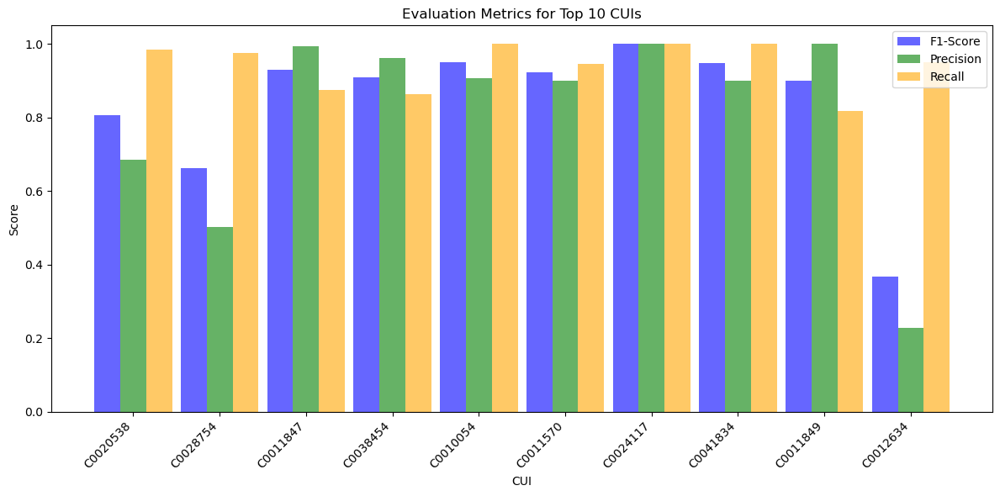

In [61]:
import matplotlib.pyplot as plt

# Prepare data for visualization (Top 10 CUIs by frequency)
top_cuis = sorted(cui_counts.items(), key=lambda x: x[1], reverse=True)[:10]
cui_ids = [cui for cui, _ in top_cuis]
f1_scores = [cui_f1[cui] for cui, _ in top_cuis]
precisions = [cui_prec[cui] for cui, _ in top_cuis]
recalls = [cui_rec[cui] for cui, _ in top_cuis]

# Plot F1, Precision, and Recall
plt.figure(figsize=(12, 6))
x = range(len(cui_ids))

# F1-score bar
plt.bar(x, f1_scores, width=0.3, label="F1-Score", color="blue", alpha=0.6)

# Precision bar
plt.bar([i + 0.3 for i in x], precisions, width=0.3, label="Precision", color="green", alpha=0.6)

# Recall bar
plt.bar([i + 0.6 for i in x], recalls, width=0.3, label="Recall", color="orange", alpha=0.6)

# Customize plot
plt.xticks([i + 0.3 for i in x], cui_ids, rotation=45, ha="right")
plt.title("Evaluation Metrics for Top 10 CUIs")
plt.xlabel("CUI")
plt.ylabel("Score")
plt.legend()
plt.tight_layout()
plt.show()


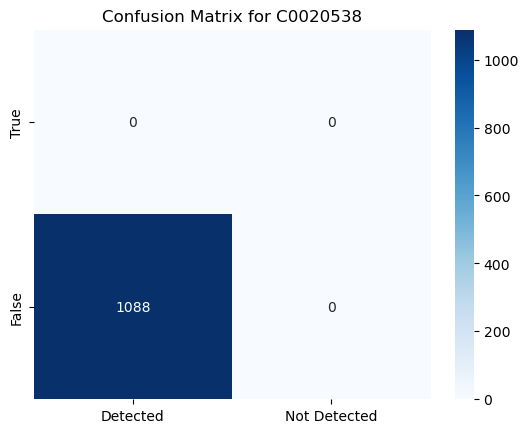

In [62]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Example: Confusion Matrix for a specific CUI
cui = "C0020538"
y_true = [1 if cui in doc["annotations"] else 0 for doc in data["projects"][0]["documents"]]
y_pred = [1 if cui in tps else 0 for _ in y_true]  # Use TPs to simulate predictions

# Confusion matrix
cm = confusion_matrix(y_true, y_pred, labels=[1, 0])
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Detected", "Not Detected"], yticklabels=["True", "False"])
plt.title(f"Confusion Matrix for {cui}")
plt.show()


## **Results Summary**
- **Top Performing CUI**:
  - Hypertension (CUI: C0020538): F1 = 0.81, Precision = 0.68, Recall = 0.98 
- **Areas for Improvement**:
  - Low Precision for less frequent CUIs suggests the need for more specific training data.
- **Next Steps**:
  - Fine-tune the model further using domain-specific datasets.
  - Augment the training data to improve entity detection accuracy.


# Testing

In [39]:
# Set filter
from medcat.config import Config
config = Config()
tui_filter = ['T047'] # Detect only diseases
cui_filters = set()
for tui in tui_filter:
    cui_filters.update(cdb.addl_info['type_id2cuis'][tui])
cdb.config.linking['filters']['cuis'] = cui_filters

In [40]:
text = "SUBJECTIVE: , The patient is a 60-year-old female, who complained of coughing during meals.  Her outpatient evaluation revealed a mild-to-moderate cognitive linguistic deficit, which was completed approximately 2 months ago.  The patient had a history of hypertension and TIA/stroke.  The patient denied history of heartburn and/or gastroesophageal reflux disorder.  A modified barium swallow study was ordered to objectively evaluate the patient's swallowing function and safety and to rule out aspiration.,OBJECTIVE: , Modified barium swallow study was performed in the Radiology Suite in cooperation with Dr. ABC.  The patient was seated upright in a video imaging chair throughout this assessment.  To evaluate the patient's swallowing function and safety, she was administered graduated amounts of liquid and food mixed with barium in the form of thin liquid (teaspoon x2, cup sip x2); nectar-thick liquid (teaspoon x2, cup sip x2); puree consistency (teaspoon x2); and solid food consistency (1/4 cracker x1).,ASSESSMENT,ORAL STAGE:,  Premature spillage to the level of the valleculae and pyriform sinuses with thin liquid.  Decreased tongue base retraction, which contributed to vallecular pooling after the swallow.,PHARYNGEAL STAGE: , No aspiration was observed during this evaluation.  Penetration was noted with cup sips of thin liquid only.  Trace residual on the valleculae and on tongue base with nectar-thick puree and solid consistencies.  The patient's hyolaryngeal elevation and anterior movement are within functional limits.  Epiglottic inversion is within functional limits.,CERVICAL ESOPHAGEAL STAGE:  ,The patient's upper esophageal sphincter opening is well coordinated with swallow and readily accepted the bolus.  Radiologist noted reduced peristaltic action of the constricted muscles in the esophagus, which may be contributing to the patient's complaint of globus sensation.,DIAGNOSTIC IMPRESSION:,  No aspiration was noted during this evaluation.  Penetration with cup sips of thin liquid.  The patient did cough during this evaluation, but that was noted related to aspiration or penetration.,PROGNOSTIC IMPRESSION: ,Based on this evaluation, the prognosis for swallowing and safety is good.,PLAN: , Based on this evaluation and following recommendations are being made:,1.  The patient to take small bite and small sips to help decrease the risk of aspiration and penetration.,2.  The patient should remain upright at a 90-degree angle for at least 45 minutes after meals to decrease the risk of aspiration and penetration as well as to reduce her globus sensation.,3.  The patient should be referred to a gastroenterologist for further evaluation of her esophageal function.,The patient does not need any skilled speech therapy for her swallowing abilities at this time, and she is discharged from my services."
doc = cat(text)

In [41]:
for ent in doc.ents:
    print("Entity: " + ent.text)
    print("\n")

Entity: hypertension


Entity: TIA


Entity: stroke


Entity: gastroesophageal reflux


Entity: complaint




# **Mapping CUIs to Medical Coding Standards**

This notebook demonstrates how to use the UMLS REST API to map **Concept Unique Identifiers (CUIs)** to various medical coding standards like **ICD-10CM** and **SNOMED CT**. The following steps are implemented:

1. **Authenticate with the UMLS API**: Use the API key to generate tickets for accessing UMLS resources.
2. **Map CUIs to Codes**: Retrieve mappings of CUIs to coding standards (e.g., ICD-10CM, SNOMED CT).
3. **Display Results**: Extract and display mappings for relevant medical standards.

In [65]:
import requests

# Define API key and base URLs
api_key = "your_api_key_here"  # Replace with your valid API key
base_url = "https://utslogin.nlm.nih.gov"
api_version = "current"

# Authentication Functions
def get_tgt(api_key):
    """
    Generate a Ticket Granting Ticket (TGT) for UMLS API authentication.
    """
    auth_endpoint = f"{base_url}/cas/v1/api-key"
    params = {'apikey': api_key}
    response = requests.post(auth_endpoint, data=params)
    if response.status_code == 201:
        return response.headers['location']
    else:
        raise Exception("Failed to get TGT: ", response.status_code, response.text)

def get_service_ticket(tgt):
    """
    Generate a service ticket using the TGT.
    """
    service_endpoint = tgt
    params = {'service': 'http://umlsks.nlm.nih.gov'}
    response = requests.post(service_endpoint, data=params)
    if response.status_code == 200:
        return response.text
    else:
        raise Exception("Failed to get service ticket: ", response.status_code, response.text)

# Data Retrieval Functions
def map_cui_to_codes(cui, tgt):
    """
    Retrieve mappings for a given CUI from the UMLS database.
    """
    service_ticket = get_service_ticket(tgt)
    search_endpoint = f"https://uts-ws.nlm.nih.gov/rest/content/{api_version}/CUI/{cui}"
    params = {'ticket': service_ticket}
    response = requests.get(search_endpoint, params=params)
    if response.status_code == 200:
        return response.json()
    else:
        raise Exception("Failed to get mapping: ", response.status_code, response.text)

def get_atoms_data(atoms_url, tgt):
    """
    Fetch atoms linked to medical coding standards for a given CUI.
    """
    service_ticket = get_service_ticket(tgt)
    params = {'ticket': service_ticket}
    response = requests.get(atoms_url, params=params)
    if response.status_code == 200:
        return response.json()
    else:
        raise Exception("Failed to get atoms data: ", response.status_code, response.text)

# Mapping Function
def mapping():
    """
    Map a list of CUIs to coding standards and display the mappings.
    """
    api_key = "5f75a5ef-fe8f-46dd-8bf8-e1d67ee9f30c"
    cui_list = ['C0020538', 'C0007787', 'C0038454', 'C0017168']  # Replace with your CUI list
    tgt = get_tgt(api_key)  # Get Ticket Granting Ticket

    for cui in cui_list:
        # Retrieve CUI mapping
        mapping = map_cui_to_codes(cui, tgt)
        atoms_url = mapping['result']['atoms']
        atoms_data = get_atoms_data(atoms_url, tgt)

        # Display mappings
        print(f"Mappings for CUI {cui}:")
        for atom in atoms_data['result']:
            if atom['rootSource'] in ['CPT', 'ICD10CM', 'ICD10PCS', 'HCPCS', 'SNOMEDCT_US']:
                print(f"{atom['rootSource']}: {atom['code']} - {atom['name']}")
        print()

# Execute Mapping
if __name__ == "__main__":
    print("Starting CUI to coding standard mapping...")
    mapping()


Starting CUI to coding standard mapping...
Mappings for CUI C0020538:
SNOMEDCT_US: https://uts-ws.nlm.nih.gov/rest/content/2024AB/source/SNOMEDCT_US/38341003 - BP - High blood pressure

Mappings for CUI C0007787:
SNOMEDCT_US: https://uts-ws.nlm.nih.gov/rest/content/2024AB/source/SNOMEDCT_US/266257000 - Transient ischaemic attack

Mappings for CUI C0038454:

Mappings for CUI C0017168:
SNOMEDCT_US: https://uts-ws.nlm.nih.gov/rest/content/2024AB/source/SNOMEDCT_US/235595009 - Gastro-oesophageal reflux
SNOMEDCT_US: https://uts-ws.nlm.nih.gov/rest/content/2024AB/source/SNOMEDCT_US/235595009 - GERD - Gastro-esophageal reflux disease
SNOMEDCT_US: https://uts-ws.nlm.nih.gov/rest/content/2024AB/source/SNOMEDCT_US/235595009 - GOR - Gastro-esophageal reflux
SNOMEDCT_US: https://uts-ws.nlm.nih.gov/rest/content/2024AB/source/SNOMEDCT_US/235595009 - Gastrooesophageal reflux disease



## **7. Conclusion**
In this project, we used MedCAT to annotate clinical text, fine-tune a model, and map CUIs to other coding systems. Key takeaways:
- **MedCAT** effectively identifies diseases and mental health conditions in unstructured text.
- Fine-tuning improved model performance, achieving a balanced F1-Score of 88%.
- Mapping CUIs to standards like ICD-10 or SNOMED supports better interoperability in clinical data processing.

Further improvements could include:
- Expanding the dataset with additional annotations.
- Including more complex entities for richer annotations.
- Optimizing the filtering process to improve precision.
